# CPS 844 Assignment 2
#### Cameron Shih, 501028169 Winter 2024

In [2]:
import pandas as pd
from apyori import apriori
from sklearn import cluster, preprocessing
import matplotlib.pyplot as plt
from openpyxl import Workbook

# Reading & Cleaning

In [3]:
data = pd.read_excel(r"C:\Users\noctu\Desktop\CPS_844\Assignment_2\Online Retail.xlsx")
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [4]:
data.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,541909.000000,541909,541909.000000,406829.000000
mean,9.552250,2011-07-04 13:34:57.156386048,4.611114,15287.690570
min,-80995.000000,2010-12-01 08:26:00,-11062.060000,12346.000000
25%,1.000000,2011-03-28 11:34:00,1.250000,13953.000000
50%,3.000000,2011-07-19 17:17:00,2.080000,15152.000000
75%,10.000000,2011-10-19 11:27:00,4.130000,16791.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,218.081158,NaN,96.759853,1713.600303


In [5]:
dropped = data.dropna()
purchases = dropped[~dropped["InvoiceNo"].str.contains("C", na=False)]
grouped = purchases.groupby('Description')
transactions = grouped['Quantity'].sum().sort_values(ascending=False)
invoices = purchases.groupby('InvoiceNo')

# Fit all transactions into a list by invoices

In [6]:
transactions = []
for iNo,items in invoices:
    transactions.append(list(items['Description'].map(str)))
    print(list(items['Description'].map(str)))
transactions

['WHITE HANGING HEART T-LIGHT HOLDER', 'WHITE METAL LANTERN', 'CREAM CUPID HEARTS COAT HANGER', 'KNITTED UNION FLAG HOT WATER BOTTLE', 'RED WOOLLY HOTTIE WHITE HEART.', 'SET 7 BABUSHKA NESTING BOXES', 'GLASS STAR FROSTED T-LIGHT HOLDER']
['HAND WARMER UNION JACK', 'HAND WARMER RED POLKA DOT']
['ASSORTED COLOUR BIRD ORNAMENT', "POPPY'S PLAYHOUSE BEDROOM ", "POPPY'S PLAYHOUSE KITCHEN", 'FELTCRAFT PRINCESS CHARLOTTE DOLL', 'IVORY KNITTED MUG COSY ', 'BOX OF 6 ASSORTED COLOUR TEASPOONS', 'BOX OF VINTAGE JIGSAW BLOCKS ', 'BOX OF VINTAGE ALPHABET BLOCKS', 'HOME BUILDING BLOCK WORD', 'LOVE BUILDING BLOCK WORD', 'RECIPE BOX WITH METAL HEART', 'DOORMAT NEW ENGLAND']
['JAM MAKING SET WITH JARS', 'RED COAT RACK PARIS FASHION', 'YELLOW COAT RACK PARIS FASHION', 'BLUE COAT RACK PARIS FASHION']
['BATH BUILDING BLOCK WORD']
['ALARM CLOCK BAKELIKE PINK', 'ALARM CLOCK BAKELIKE RED ', 'ALARM CLOCK BAKELIKE GREEN', 'PANDA AND BUNNIES STICKER SHEET', 'STARS GIFT TAPE ', 'INFLATABLE POLITICAL GLOBE ', 'VIN

[['WHITE HANGING HEART T-LIGHT HOLDER',
  'WHITE METAL LANTERN',
  'CREAM CUPID HEARTS COAT HANGER',
  'KNITTED UNION FLAG HOT WATER BOTTLE',
  'RED WOOLLY HOTTIE WHITE HEART.',
  'SET 7 BABUSHKA NESTING BOXES',
  'GLASS STAR FROSTED T-LIGHT HOLDER'],
 ['HAND WARMER UNION JACK', 'HAND WARMER RED POLKA DOT'],
 ['ASSORTED COLOUR BIRD ORNAMENT',
  "POPPY'S PLAYHOUSE BEDROOM ",
  "POPPY'S PLAYHOUSE KITCHEN",
  'FELTCRAFT PRINCESS CHARLOTTE DOLL',
  'IVORY KNITTED MUG COSY ',
  'BOX OF 6 ASSORTED COLOUR TEASPOONS',
  'BOX OF VINTAGE JIGSAW BLOCKS ',
  'BOX OF VINTAGE ALPHABET BLOCKS',
  'HOME BUILDING BLOCK WORD',
  'LOVE BUILDING BLOCK WORD',
  'RECIPE BOX WITH METAL HEART',
  'DOORMAT NEW ENGLAND'],
 ['JAM MAKING SET WITH JARS',
  'RED COAT RACK PARIS FASHION',
  'YELLOW COAT RACK PARIS FASHION',
  'BLUE COAT RACK PARIS FASHION'],
 ['BATH BUILDING BLOCK WORD'],
 ['ALARM CLOCK BAKELIKE PINK',
  'ALARM CLOCK BAKELIKE RED ',
  'ALARM CLOCK BAKELIKE GREEN',
  'PANDA AND BUNNIES STICKER SHEET'

# Association Analysis

In [7]:
itemsets = apriori(transactions, min_support = 0.01, min_confidence = 0.5, use_colnames=True)


In [8]:
for itemset in itemsets:
    for rule_index in range(len(itemset.ordered_statistics)):
        print(list(itemset.ordered_statistics[rule_index].items_base),
              '->',
              list(itemset.ordered_statistics[rule_index].items_add),
              ', Support:', itemset.support,
              ', Confidence:', itemset.ordered_statistics[rule_index].confidence)

['60 CAKE CASES DOLLY GIRL DESIGN'] -> ['PACK OF 72 RETROSPOT CAKE CASES'] , Support: 0.010196374622356496 , Confidence: 0.5338983050847458
['60 TEATIME FAIRY CAKE CASES'] -> ['PACK OF 72 RETROSPOT CAKE CASES'] , Support: 0.017803193785066895 , Confidence: 0.502283105022831
['ALARM CLOCK BAKELIKE CHOCOLATE'] -> ['ALARM CLOCK BAKELIKE GREEN'] , Support: 0.011329305135951661 , Confidence: 0.6521739130434782
['ALARM CLOCK BAKELIKE CHOCOLATE'] -> ['ALARM CLOCK BAKELIKE RED '] , Support: 0.012192490289167026 , Confidence: 0.701863354037267
['ALARM CLOCK BAKELIKE IVORY'] -> ['ALARM CLOCK BAKELIKE GREEN'] , Support: 0.01483599482088908 , Confidence: 0.5876068376068376
['ALARM CLOCK BAKELIKE ORANGE'] -> ['ALARM CLOCK BAKELIKE GREEN'] , Support: 0.011868795856711264 , Confidence: 0.6128133704735376
['ALARM CLOCK BAKELIKE PINK'] -> ['ALARM CLOCK BAKELIKE GREEN'] , Support: 0.01850453172205438 , Confidence: 0.5595432300163132
['ALARM CLOCK BAKELIKE GREEN'] -> ['ALARM CLOCK BAKELIKE RED '] , Suppo

# Clustering Analysis


In [9]:
purchases['Amount'] = purchases['Quantity']*purchases['UnitPrice']
revenue = purchases.groupby('CustomerID')['Amount'].sum().reset_index()
revenue

C:\Users\noctu\AppData\Local\Temp\ipykernel_788\472546323.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  purchases['Amount'] = purchases['Quantity']*purchases['UnitPrice']


,CustomerID,Amount
0,12346.0,77183.60
1,12347.0,4310.00
2,12348.0,1797.24
3,12349.0,1757.55
4,12350.0,334.40
...,...,...
4334,18280.0,180.60
4335,18281.0,80.82
4336,18282.0,178.05
4337,18283.0,2094.88


In [10]:
frequency = purchases.groupby('CustomerID')['InvoiceNo'].count().reset_index()
frequency

,CustomerID,InvoiceNo
0,12346.0,1
1,12347.0,182
2,12348.0,31
3,12349.0,73
4,12350.0,17
...,...,...
4334,18280.0,10
4335,18281.0,7
4336,18282.0,12
4337,18283.0,756


In [11]:
purchases['InvoiceDate'] = pd.to_datetime(purchases['InvoiceDate'])
purchases['Latest'] = (max(purchases['InvoiceDate']) - purchases['InvoiceDate']).dt.days
last = purchases.groupby('CustomerID')['Latest'].max().reset_index()
last

C:\Users\noctu\AppData\Local\Temp\ipykernel_788\2200613839.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  purchases['InvoiceDate'] = pd.to_datetime(purchases['InvoiceDate'])
C:\Users\noctu\AppData\Local\Temp\ipykernel_788\2200613839.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  purchases['Latest'] = (max(purchases['InvoiceDate']) - purchases['InvoiceDate']).dt.days


,CustomerID,Latest
0,12346.0,325
1,12347.0,366
2,12348.0,357
3,12349.0,18
4,12350.0,309
...,...,...
4334,18280.0,277
4335,18281.0,180
4336,18282.0,125
4337,18283.0,336


In [12]:
merge = pd.merge(revenue, frequency, on='CustomerID', how='inner')
rfm = pd.merge(last, merge, on='CustomerID', how='inner')
rfm.columns = ['CustomerID', 'LatestTransaction', 'Total', 'TotalPurchases']
rfm

,CustomerID,LatestTransaction,Total,TotalPurchases
0,12346.0,325,77183.60,1
1,12347.0,366,4310.00,182
2,12348.0,357,1797.24,31
3,12349.0,18,1757.55,73
4,12350.0,309,334.40,17
...,...,...,...,...
4334,18280.0,277,180.60,10
4335,18281.0,180,80.82,7
4336,18282.0,125,178.05,12
4337,18283.0,336,2094.88,756


<Axes: >

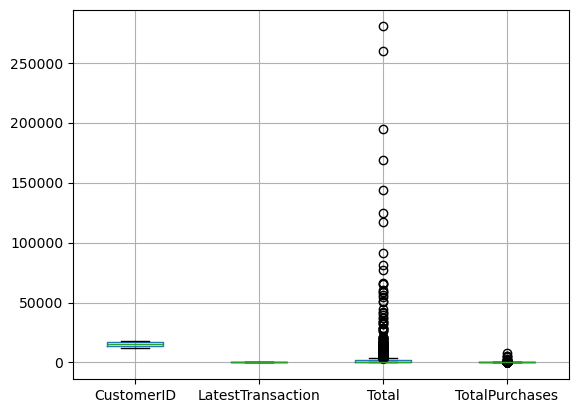

In [13]:
rfm.boxplot()

# Remove Outliers in Total Column
## Using Interquartile Range

In [14]:
IQR = rfm['Total'].quantile(0.75) - rfm['Total'].quantile(0.25)
lower = rfm['Total'].quantile(0.25) - 1.5 * IQR
upper = rfm['Total'].quantile(0.75) + 1.5 * IQR
rfm_out = rfm[(rfm['Total'] < upper) & (rfm['Total'] > lower)].reset_index(drop=True)

rfm_out

,CustomerID,LatestTransaction,Total,TotalPurchases
0,12348.0,357,1797.24,31
1,12349.0,18,1757.55,73
2,12350.0,309,334.40,17
3,12352.0,296,2506.04,85
4,12353.0,203,89.00,4
...,...,...,...,...
3907,18280.0,277,180.60,10
3908,18281.0,180,80.82,7
3909,18282.0,125,178.05,12
3910,18283.0,336,2094.88,756


# Scaling the Data

In [15]:
scaler = preprocessing.StandardScaler()
nums_rfm = rfm_out[['LatestTransaction', 'Total', 'TotalPurchases']]
scaled_rfm = scaler.fit_transform(nums_rfm)
scaled_rfm = pd.DataFrame(scaled_rfm)
scaled_rfm.columns = ['LatestTransaction', 'Total', 'TotalPurchases']
scaled_rfm

,LatestTransaction,Total,TotalPurchases
0,1.246977,1.099421,-0.394646
1,-1.654609,1.051512,0.148701
2,0.836133,-0.666340,-0.575761
3,0.724863,1.954997,0.303943
4,-0.071148,-0.962557,-0.743940
...,...,...,...
3907,0.562237,-0.851989,-0.666319
3908,-0.268011,-0.972431,-0.705130
3909,-0.738769,-0.855067,-0.640446
3910,1.067233,1.458695,8.984552


# Elbow Method

In [16]:
SSE = []
for i in range(1,11):
    kmeans = cluster.KMeans(n_clusters=i)
    kmeans.fit(scaled_rfm)
    SSE.append(kmeans.inertia_)

c:\Users\noctu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\noctu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\noctu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\noctu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\noctu\anaconda3\Lib\site-packages\sklearn\clust

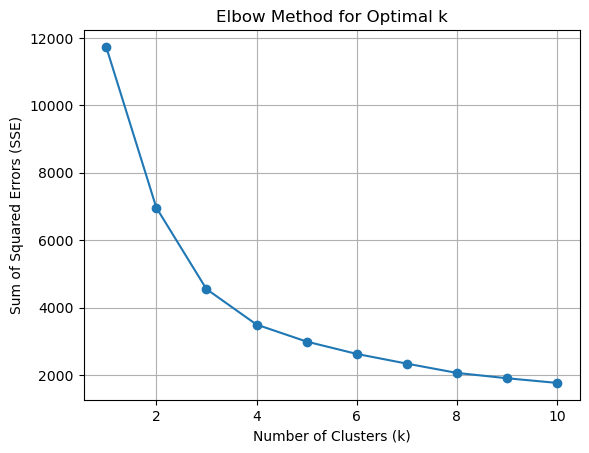

In [17]:
plt.plot(range(1, 11), SSE, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()

In [18]:
km = cluster.KMeans(n_clusters=3)
y_predict = km.fit_predict(scaled_rfm)
scaled_rfm['ClusterNo'] = y_predict
scaled_rfm

c:\Users\noctu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,LatestTransaction,Total,TotalPurchases,ClusterNo
0,1.246977,1.099421,-0.394646,0
1,-1.654609,1.051512,0.148701,1
2,0.836133,-0.666340,-0.575761,0
3,0.724863,1.954997,0.303943,2
4,-0.071148,-0.962557,-0.743940,0
...,...,...,...,...
3907,0.562237,-0.851989,-0.666319,0
3908,-0.268011,-0.972431,-0.705130,1
3909,-0.738769,-0.855067,-0.640446,1
3910,1.067233,1.458695,8.984552,2


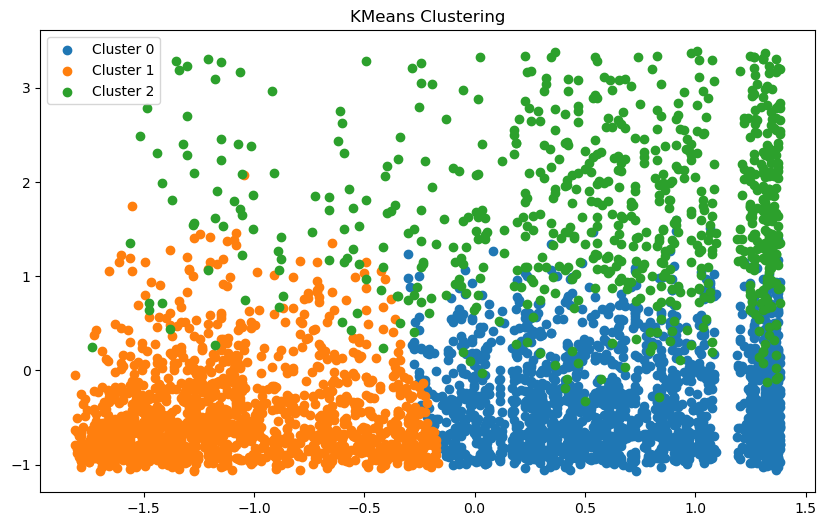

In [19]:
plt.figure(figsize=(10,6))
for cluster_no in scaled_rfm['ClusterNo'].unique():
    cluster_data = scaled_rfm[scaled_rfm['ClusterNo'] == cluster_no]
    plt.scatter(cluster_data.iloc[:, 0], cluster_data.iloc[:, 1], label=f'Cluster {cluster_no}')
plt.title('KMeans Clustering')
plt.legend()
plt.show()